In [26]:
# ===================
# Breaking down the fgco2 equation as a function of timescale. This code is adapted from Cosme's original code.
# The first plots demonstrate if/when we can get the offline FGCO2 and online FGCO2 to match adequately.
# The subsequent plots then look at the effect of 1) holding one variable constant, or 2) holding all variables
# EXCEPT one constant: Basically two different ways of estimating the importance of different variables.
# CONCLUSION: DPCO2 is very important on all timescales in the North Atlantic SPG
# ===================
# NOTE: Further analysis is in the notebook: CO2_Offline_TimeSeries.ipynb
# ===================

In [23]:
process_data = False
process_corrs = True

import netCDF4
import os
import cartopy.crs as ccrs
import numpy as np
import scipy.interpolate.ndgriddata as ndgriddata
import pickle
import sys
from scipy import stats
import mfilter

data_dir = '/data/mmenary/fgco2'
var_names = ['dpco2', 'sfcWind', 'siconc', 'sos', 'tos', 'fgco2']
constant_vars = ['none', 'dpco2', 'sfcWind', 'siconc', 'sos', 'tos']
output_dir = '/home/mmenary/python/notebooks/CO2_Py3x/output'
year0s = [1850, 2100, 2350, 2600, 2850, 3100, 3350, 3600]

#########
year0 = 1850
oneConstant = 'False'
season = 1
########
nyrs = 250

def compute_fgco2(input_data, verbose=False):
    '''
    Reads in the various components and computes the fgco2.
    tos: DegC
    sos: PSU g/kg
    wind: m/s
    dpco2: Pa
    sea_ice: % (will be converted to fraction)
    '''
    ### Constantes
    rhop = 1025  ## What is this? According to Fortran, potential volumic mass [kg/m3]
#     constants = 1000 * 0.01 / 3600. * 0.251 
    
    ## tos is potential temp., rather than in situ (required), but as we're only at surface it doesn't matter
    
    ### KO
    if verbose: print("Computing K0")
    tos_kel = input_data['tos'] + 273.15  # OK
    zcek1 = 9345.17/tos_kel - 60.2409 + 23.3585 * np.log(tos_kel*0.01) + input_data['sos'] * (0.023517 - 0.00023656 * tos_kel + 0.0047036e-4 * tos_kel * tos_kel)  ## OK
    chemc = np.exp(zcek1) * rhop / 1000   ## OK
    del tos_kel, zcek1  # save memory
    
    ### Schmidt Number
    if verbose: print("Computing Schmidt No.")
    ztc = np.minimum(35, input_data['tos'])  ## OK
    sch_co2 = 2116.8 - 136.25 * ztc + 4.7353 * ztc * ztc - 0.092307 * ztc * ztc * ztc + 0.0007555 * ztc * ztc * ztc *ztc  ## OK
    del ztc  # save memory
    
    ### Wind
    if verbose: print("Computing Wind squared")
    wind_contrib = input_data['sfcWind'] * input_data['sfcWind'] * 0.251 * 0.01 / 3600.
    sea_ice_contrib = (1 - input_data['siconc'] / 100)
    
    ### delta pCOs
    dpco2_2 = input_data['dpco2'] / 101325.  # From Pa to atm
    
    ## Notes:
    ## 0.251 (cm/h)(m/s)-2

    ### Calcul
    if verbose: print("Doing final calculation")
    fgco2_calc = wind_contrib * sea_ice_contrib * dpco2_2 * chemc * np.sqrt(660. / sch_co2) * 1e3  # molC/m2/s (Laurent)
    ## Not sure about this  1e3. But it could be conversion from litre to m3 
        
    fgco2_calc *= (12 / 1000)  # kgC/m2/s
    return fgco2_calc

def regrid_to_ocean_grid(fld, lon_wind, lat_wind):
    '''
    Regrid surface winds
    '''
    nt, nj, ni = fld.shape

    lon_wind_shifted = lon_wind.copy()
    lon_wind_shifted[lon_wind_shifted >= 180] -= 360
    lon_wind2d = np.repeat(lon_wind_shifted[np.newaxis, :], nj, axis=0)
    lat_wind2d = np.repeat(lat_wind[:, None], ni, axis=1)

    nj2, ni2 = nav_lon.shape
    fld_regridded = np.ma.masked_all(shape=(nt, nj2, ni2))
    for tt in range(nt):
        fld_regridded[tt, :, :] = ndgriddata.griddata((lon_wind2d.flatten(), lat_wind2d.flatten()),
                                                      fld[tt, :, :].flatten(), (nav_lon, nav_lat), method="linear")
    
    return fld_regridded

def regrid_for_plotting(fld):
    '''
    Regrid for plotting
    '''
    fld_regridded = ndgriddata.griddata((nav_lon.flatten(), nav_lat.flatten()),
                                        fld.flatten(), (lon_re, lat_re), method="linear")
    mask_regridded = ndgriddata.griddata((nav_lon.flatten(), nav_lat.flatten()),
                                         fld.mask.flatten(), (lon_re, lat_re), method="linear")

    fld_regridded = np.ma.array(fld_regridded, mask=mask_regridded)
    
    return fld_regridded

def spatial_correlation(fgco2_fld, other_fld, testing=False, smoothing=1, detrend=False):
    nyrs, nj, ni = fgco2_fld.shape
    slope_fld = np.ma.masked_all(shape=(nj, ni))
    inter_fld = np.ma.masked_all(shape=(nj, ni))
    corr_fld  = np.ma.masked_all(shape=(nj, ni))
    for jj in range(nj):
        if testing:
            if jj < 250: continue
            if jj > 300: continue
        for ii in range(ni):
            if testing:
                if ii < 220: continue
                if ii > 300: continue
            if np.ma.is_masked(fgco2_fld[0, jj, ii]):
                continue
            fgco2_ts = fgco2_fld[:, jj, ii]
            other_ts = other_fld[:, jj, ii]
            
            if detrend:
                fgco2_longperiod = mfilter.smooth1d(fgco2_ts, 71, mask_ends=True)
                other_longperiod = mfilter.smooth1d(other_ts, 71, mask_ends=True)
                fgco2_ts = fgco2_ts - (fgco2_longperiod - fgco2_longperiod.mean())
                other_ts = other_ts - (other_longperiod - other_longperiod.mean())
                
            if smoothing > 1:
                fgco2_ts = mfilter.smooth1d(fgco2_ts, smoothing, mask_ends=True)
                other_ts = mfilter.smooth1d(other_ts, smoothing, mask_ends=True)
                
            real = np.nonzero(fgco2_ts * other_ts)
            slope, inter, corr, _, _ = stats.linregress(other_ts[real], fgco2_ts[real])
            slope_fld[jj, ii] = slope
            inter_fld[jj, ii] = inter
            corr_fld[jj, ii]  = corr
            
    return [slope_fld, inter_fld, corr_fld]

def get_t_indices(iyr2, season):
    if season == 0:
        tt0, tt1 = iyr2 * 12, (iyr2 + 1) * 12
    else:
        iseason = season - 1
        tt0, tt1 = iyr2 * 12 + iseason * 3, iyr2 * 12 + (iseason + 1) * 3
    return tt0, tt1

nj, ni = 180, 360
lon_re = np.repeat((np.arange(-180, 180) + 0.5)[np.newaxis, :], nj, axis=0)
lat_re = np.repeat((np.arange(-90, 90) + 0.5)[:, None], ni, axis=1)

In [3]:
# ============================
# This bit is parallelised in a batch script: CO2_offline.py
# ============================
year0 = np.long(sys.argv[1])
oneConstant = sys.argv[2]
season = np.long(sys.argv[3])
if process_data:
    if oneConstant == 'True':
        oneConstant = True
    else:
        oneConstant = False
        
    if season == 0:
        season_string = ''
    else:
        season_string = '_Season{:d}'.format(season)

    year1 = year0 + nyrs
    if oneConstant:
        save_file = '/data/mmenary/python_saves/CO2_OneConstant_{:d}-{:d}{:s}.pkl'.format(year0, year1, season_string)
    else:
        save_file = '/data/mmenary/python_saves/CO2_OneVaries_{:d}-{:d}{:s}.pkl'.format(year0, year1, season_string)

    years_full = 1850 + np.arange(2000)
    years = year0 + np.arange(nyrs)

    ##################
    remake_first_save = True

    print(save_file)
    if os.path.isfile(save_file) and not remake_first_save:
        with open(save_file, 'rb') as handle:
            fgco2_ann_oneConstantVary, fgco2_ann_online, nav_lon, nav_lat = pickle.load(handle)
    else:
        # =================
        # Make monthly climatologies
        # =================
        file_end = '_MonClim.nc'
        clim_data = {}
        for ivar, var_name in enumerate(var_names):
            file_name = os.path.join(data_dir, var_name + file_end)
            print(file_name)

            loaded = netCDF4.Dataset(file_name)

            if var_name == 'sfcWind':
                wind_raw = loaded.variables[var_name][:]
                lat_wind = loaded.variables['lat'][:]
                lon_wind = loaded.variables['lon'][:]
                clim_data[var_name] = regrid_to_ocean_grid(wind_raw, lon_wind, lat_wind)
            else:
                nav_lat = loaded.variables['nav_lat'][:-1, 1:-1]
                nav_lon = loaded.variables['nav_lon'][:-1, 1:-1]        
                clim_data[var_name] = loaded.variables[var_name][:, :-1, 1:-1]

        # =================
        # Compute the ann mean from online fgco2
        # =================
        file_end = '_temp.nc'
        nj, ni = nav_lon.shape
        fgco2_ann_online = np.ma.masked_all(shape=(nyrs, nj, ni))
        for iyr, year in enumerate(years):
            if year not in years_full:
                continue

            print('Processing (fgco2 online): {:d}'.format(year))
            iyr2 = iyr + (year0 - 1850)
            tt0, tt1 = get_t_indices(iyr2, season)

            file_name = os.path.join(data_dir, 'fgco2' + file_end)
            loaded = netCDF4.Dataset(file_name)
            input_data = loaded.variables['fgco2'][tt0:tt1, :-1, 1:-1]

            fgco2_ann_online[iyr, :, :] = input_data.mean(axis=0)

        # =================
        # Prepare dictionaries
        # =================
        fgco2_ann_oneConstantVary = {}
        for constant_var in constant_vars:
            nj, ni = nav_lon.shape
            fgco2_ann_oneConstantVary[constant_var] = np.ma.masked_all(shape=(nyrs, nj, ni))

        # =================
        # Compute ann mean fgco2 contributions (from mon mean contributions)
        # =================
        if oneConstant:
            for constant_var in constant_vars:
                for iyr, year in enumerate(years):
                    if year not in years_full:
                        continue

                    print('Processing (one constant) {:s}: {:d}'.format(constant_var, year))
                    iyr2 = iyr + (year0 - 1850)
                    tt0, tt1 = get_t_indices(iyr2, season)

                    input_data = {}
                    for ivar, var_name in enumerate(var_names):
                        if constant_var == var_name:
                            if season == 0:
                                input_data[var_name] = clim_data[var_name].copy()
                            else:
                                cc0 = (season - 1) * 3
                                cc1 = cc0 + 3
                                input_data[var_name] = clim_data[var_name][cc0:cc1, :, :].copy()
                        else:
                            file_name = os.path.join(data_dir, var_name + file_end)
                            loaded = netCDF4.Dataset(file_name)
                            if var_name == 'sfcWind':
                                input_data[var_name] = loaded.variables[var_name][tt0:tt1, :, :]
                                input_data[var_name] = regrid_to_ocean_grid(input_data[var_name], lon_wind, lat_wind)
                            else:
                                input_data[var_name] = loaded.variables[var_name][tt0:tt1, :-1, 1:-1]

                    fgco2_ann_oneConstantVary[constant_var][iyr, :, :] = compute_fgco2(input_data).mean(axis=0)

        else:
            for constant_var in constant_vars:
                for iyr, year in enumerate(years):
                    if year not in years_full:
                        continue

                    print('Processing (one varies) {:s}: {:d}'.format(constant_var, year))
                    iyr2 = iyr + (year0 - 1850)
                    tt0, tt1 = get_t_indices(iyr2, season)

                    input_data = {}
                    for ivar, var_name in enumerate(var_names):
                        if constant_var == var_name:
                            file_name = os.path.join(data_dir, var_name + file_end)
                            loaded = netCDF4.Dataset(file_name)
                            if var_name == 'sfcWind':
                                input_data[var_name] = loaded.variables[var_name][tt0:tt1, :, :]
                                input_data[var_name] = regrid_to_ocean_grid(input_data[var_name], lon_wind, lat_wind)
                            else:
                                input_data[var_name] = loaded.variables[var_name][tt0:tt1, :-1, 1:-1]
                        else:
                            if season == 0:
                                input_data[var_name] = clim_data[var_name].copy()
                            else:
                                cc0 = (season - 1) * 3
                                cc1 = cc0 + 3
                                input_data[var_name] = clim_data[var_name][cc0:cc1, :, :].copy()

                    fgco2_ann_oneConstantVary[constant_var][iyr, :, :] = compute_fgco2(input_data).mean(axis=0)

        with open(save_file, 'wb') as handle:
            pickle.dump([fgco2_ann_oneConstantVary, fgco2_ann_online, nav_lon, nav_lat],
                        handle, protocol=pickle.HIGHEST_PROTOCOL)
print("Done!")

In [4]:
# ============================
# This bit is not parallelised but slow, so it is also in a batch script: CO2_offline_corrs.py
# ============================
if process_corrs:
    detrend = sys.argv[1]
    if detrend == "True":
        detrend = True
    elif detrend == "False":
        detrend = False
    else:
        raise ValueError('Huh?')
    season = np.long(sys.argv[2])

    chunks = []
    nchunks_i = 4
    nchunks_j = 4

    nj2, ni2 = 331, 360
    di = np.long(np.ceil(ni2 / nchunks_i))
    dj = np.long(np.ceil(nj2 / nchunks_j))
    for ii in range(nchunks_i):
        ii0 = ii * di
        ii1 = min((ii + 1) * di, ni2)
        for jj in range(nchunks_j):
            jj0 = jj * dj
            jj1 = min((jj + 1) * dj, nj2)
            new_chunk = [ii0, ii1, jj0, jj1]
            chunks.append(new_chunk)

    print("Chunks",  chunks)
    print("Total chunks = {:d}".format(nchunks_i * nchunks_j))

    remake_corr_save = False

    if detrend:
        detrend_string = '_detrended71Y'
    else:
        detrend_string = ''

    if season == 0:
        season_string = ''
    else:
        season_string = '_Season{:d}'.format(season)

    save_file_corrs = '/data/mmenary/python_saves/CO2_ConstantVarCorrs{:s}{:s}.pkl'.format(detrend_string, season_string)
    if os.path.isfile(save_file_corrs) and not remake_corr_save:
        print("Loading corr save file: {:s}".format(save_file_corrs))
        with open(save_file_corrs, 'rb') as handle:
            slopes_oneConstant, inters_oneConstant, corrs_oneConstant, slopes_oneVary, inters_oneVary, \
            corrs_oneVary, smoothings, nav_lon, nav_lat = pickle.load(handle)
    else:
        smoothings = [1, 3, 5, 7, 11, 15, 21, 31, 41, 51, 71]
        slopes_oneConstant, inters_oneConstant, corrs_oneConstant = {}, {}, {}
        slopes_oneVary, inters_oneVary, corrs_oneVary = {}, {}, {}
        for var in constant_vars:
            slopes_oneConstant[var] = np.ma.masked_all(shape=(len(smoothings), nj2, ni2))
            inters_oneConstant[var] = np.ma.masked_all(shape=(len(smoothings), nj2, ni2))
            corrs_oneConstant[var]  = np.ma.masked_all(shape=(len(smoothings), nj2, ni2))
            slopes_oneVary[var] = np.ma.masked_all(shape=(len(smoothings), nj2, ni2))
            inters_oneVary[var] = np.ma.masked_all(shape=(len(smoothings), nj2, ni2))
            corrs_oneVary[var]  = np.ma.masked_all(shape=(len(smoothings), nj2, ni2))

        for ichunk, chunk in enumerate(chunks):
            ###################################################
    #         if ichunk != 15: continue

            ii0, ii1, jj0, jj1 = chunk
            fgco2_ann_oneConstant = {}
            fgco2_ann_oneVary = {}
            for var in constant_vars:
                fgco2_ann_oneConstant[var] = np.ma.masked_all(shape=(2000, jj1-jj0, ii1-ii0))
                fgco2_ann_oneVary[var] = np.ma.masked_all(shape=(2000, jj1-jj0, ii1-ii0))

            print("Working on chunk: [{:d}, {:d}, {:d}, {:d}]".format(ii0, ii1, jj0, jj1))
            for iyr, year0 in enumerate(year0s):
                ###################################################
    #             if iyr > 0: continue
                year1 = year0 + nyrs
                tt0 = year0 - 1850
                tt1 = year1 - 1850
                save_file_constant = '/data/mmenary/python_saves/CO2_OneConstant_{:d}-{:d}{:s}.pkl'.format(year0, year1, season_string)
                save_file_vary = '/data/mmenary/python_saves/CO2_OneVaries_{:d}-{:d}{:s}.pkl'.format(year0, year1, season_string)

                if os.path.isfile(save_file_constant):
                    print("Loading: {:s}".format(save_file_constant))
                    with open(save_file_constant, 'rb') as handle:
                        fgco2_ann_oneConstant_in, _, nav_lon, nav_lat = pickle.load(handle)
                    for key in constant_vars:
                        fgco2_ann_oneConstant[key][tt0:tt1, :, :] = fgco2_ann_oneConstant_in[key][:, jj0:jj1, ii0:ii1]
                        fgco2_ann_oneConstant_in[key] = 0
                else:
                    print("Could not find: {:s}".format(save_file_constant))

                if os.path.isfile(save_file_vary):
                    print("Loading: {:s}".format(save_file_vary))
                    with open(save_file_vary, 'rb') as handle:
                        fgco2_ann_oneVary_in, _, nav_lon, nav_lat = pickle.load(handle)
                    for key in constant_vars:
                        fgco2_ann_oneVary[key][tt0:tt1, :, :] = fgco2_ann_oneVary_in[key][:, jj0:jj1, ii0:ii1]
                        fgco2_ann_oneVary_in[key] = 0
                else:
                    print("Could not find: {:s}".format(save_file_vary))

            for var in constant_vars:
                if var == 'none':
                    continue
                print('Correlations for: {:s}'.format(var))
                for ismooth, smoothing in enumerate(smoothings):
                    slope, inter, corr = spatial_correlation(fgco2_ann_oneConstant['none'], fgco2_ann_oneConstant[var],
                                                             testing=False, smoothing=smoothing, detrend=detrend)
                    slopes_oneConstant[var][ismooth, jj0:jj1, ii0:ii1] = slope
                    inters_oneConstant[var][ismooth, jj0:jj1, ii0:ii1] = inter
                    corrs_oneConstant[var][ismooth, jj0:jj1, ii0:ii1]  = corr

                    ## Note that the target is fgco2_ann_oneConstant['none'] as that has nothing constant
                    slope, inter, corr = spatial_correlation(fgco2_ann_oneConstant['none'], fgco2_ann_oneVary[var],
                                                             testing=False, smoothing=smoothing, detrend=detrend)
                    slopes_oneVary[var][ismooth, jj0:jj1, ii0:ii1] = slope
                    inters_oneVary[var][ismooth, jj0:jj1, ii0:ii1] = inter
                    corrs_oneVary[var][ismooth, jj0:jj1, ii0:ii1]  = corr

        with open(save_file_corrs, 'wb') as handle:
            print("Saving to: {:s}".format(save_file_corrs))
            pickle.dump([slopes_oneConstant, inters_oneConstant, corrs_oneConstant,
                         slopes_oneVary, inters_oneVary, corrs_oneVary, smoothings, nav_lon, nav_lat],
                        handle, protocol=pickle.HIGHEST_PROTOCOL)
print("Done!")

Chunks [[0, 90, 0, 83], [0, 90, 83, 166], [0, 90, 166, 249], [0, 90, 249, 331], [90, 180, 0, 83], [90, 180, 83, 166], [90, 180, 166, 249], [90, 180, 249, 331], [180, 270, 0, 83], [180, 270, 83, 166], [180, 270, 166, 249], [180, 270, 249, 331], [270, 360, 0, 83], [270, 360, 83, 166], [270, 360, 166, 249], [270, 360, 249, 331]]
Total chunks = 16
Loading corr save file: /data/mmenary/python_saves/CO2_ConstantVarCorrs_detrended71Y.pkl
Done!


In [5]:
## Whilst working on CO2_offline.py, read in another nav_lon var

file_name = os.path.join(data_dir, 'fgco2_MonClim.nc')
print(file_name)

loaded = netCDF4.Dataset(file_name)
nav_lat = loaded.variables['nav_lat'][:-1, 1:-1]
nav_lon = loaded.variables['nav_lon'][:-1, 1:-1]    

/data/mmenary/fgco2/fgco2_MonClim.nc


In [6]:
import matplotlib.pyplot as plt
import matplotlib.tri as tri
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
import matplotlib.gridspec as gridspec
%matplotlib inline

fontsize = 28
fontsize2 = 20
xlabels = np.array((-180, -120, -60, 0, 60, 120, 180))
ylabels = np.array((-90, -60, -30, 0, 30, 60, 90))

def plot_stuff(showx=True, showy=True):
    ax.coastlines()
    gl = ax.gridlines(crs = ccrs.PlateCarree(), linewidth = 2, color = 'gray', alpha = 0.3)
    if showx:
        ax.set_xticks(xlabels)
        ax.set_xticklabels(xlabels, fontsize=fontsize2)
    if showy:
        ax.set_yticks(ylabels)
        ax.set_yticklabels(ylabels, fontsize=fontsize2)

cmap = plt.get_cmap('coolwarm')
nrows = 2
ncols = 3
gs1 = gridspec.GridSpec(nrows, ncols)
gs1.update(wspace=0.15, hspace=0.05)

plot_validate_flds = False
if plot_validate_flds:
    levels = np.linspace(-2, 2, 11) / 1e9
    norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)
    
    fig = plt.figure(figsize = (20, 12))
    fig.patch.set_facecolor('white')

    for ivar, var_name in enumerate(constant_vars):
        ax = plt.subplot(gs1[ivar], projection=ccrs.PlateCarree())
        clevs = ax.pcolormesh(lon_re, lat_re, regrid_for_plotting(fgco2_ann_derived[var_name][0, :, :]),
                              cmap=cmap, norm=norm) 
        ax.set_title('{:s}'.format(var_name), fontsize=fontsize)
        plot_stuff()

    cax = fig.add_axes([0.12, 0.05, 0.78, 0.03])
    cb = fig.colorbar(clevs, cax=cax, extend='both', orientation='horizontal')
    cb.set_label(label='Correlation [-1, 1]', fontsize=fontsize)
    cb.ax.tick_params(labelsize=fontsize) 

    # fig_save_file = '{:s}/CO2_OnlineVersusOffline.png'
    # fig_save_file = fig_save_file.format(output_dir, fig_save_file)
    # plt.savefig(fig_save_file, bbox_inches = 'tight')
    # print(fig_save_file)

/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneConstant_Smoothing1Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneConstant_Smoothing3Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneConstant_Smoothing5Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneConstant_Smoothing7Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneConstant_Smoothing11Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneConstant_Smoothing15Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneConstant_Smoothing21Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneConstant_Smoothing31Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneConstant_Smoothing41Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneConstant_Smoothing51Y_detrended71

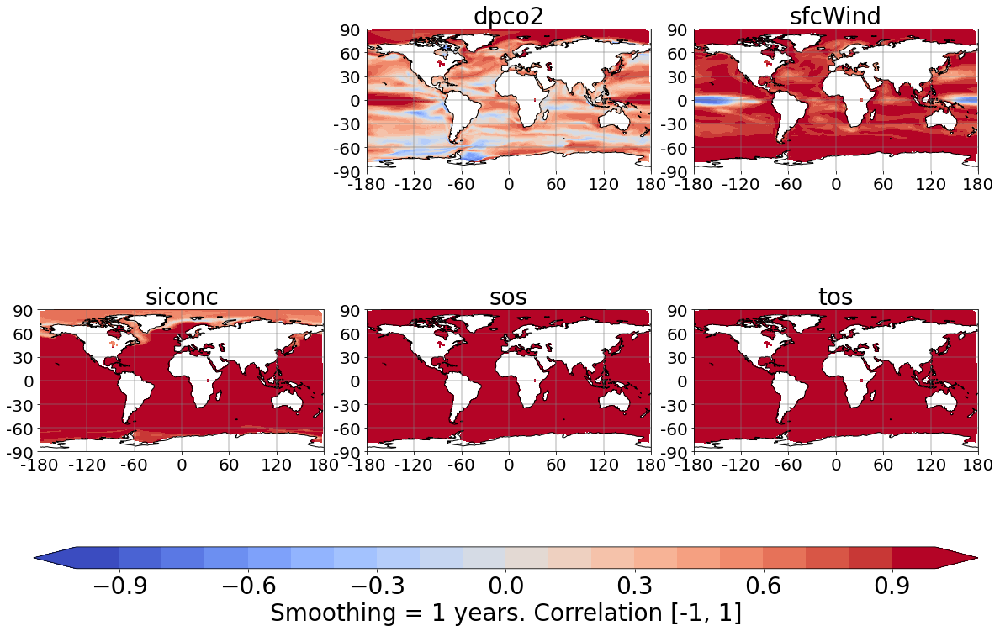

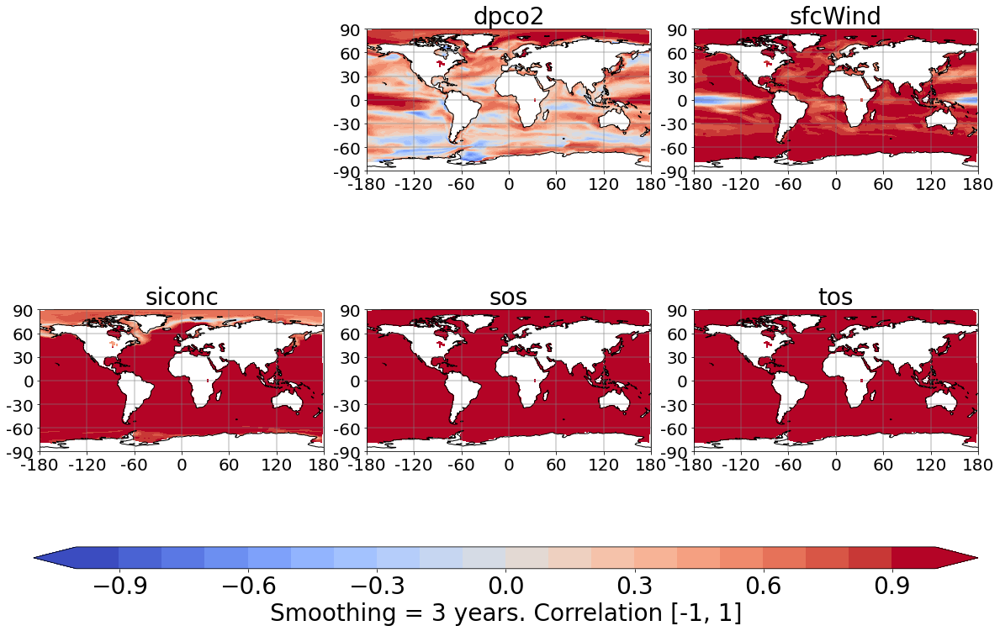

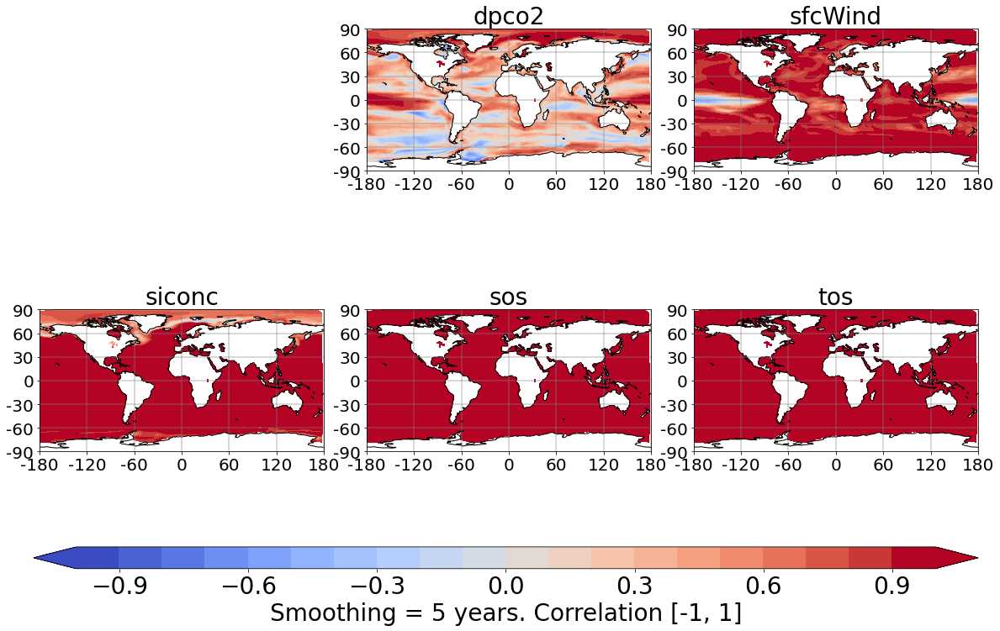

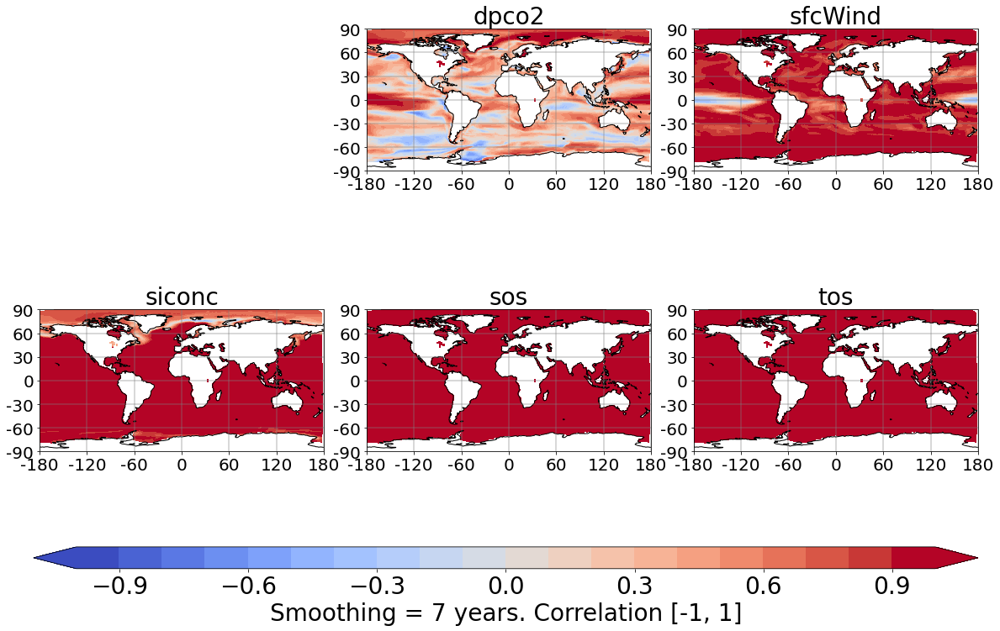

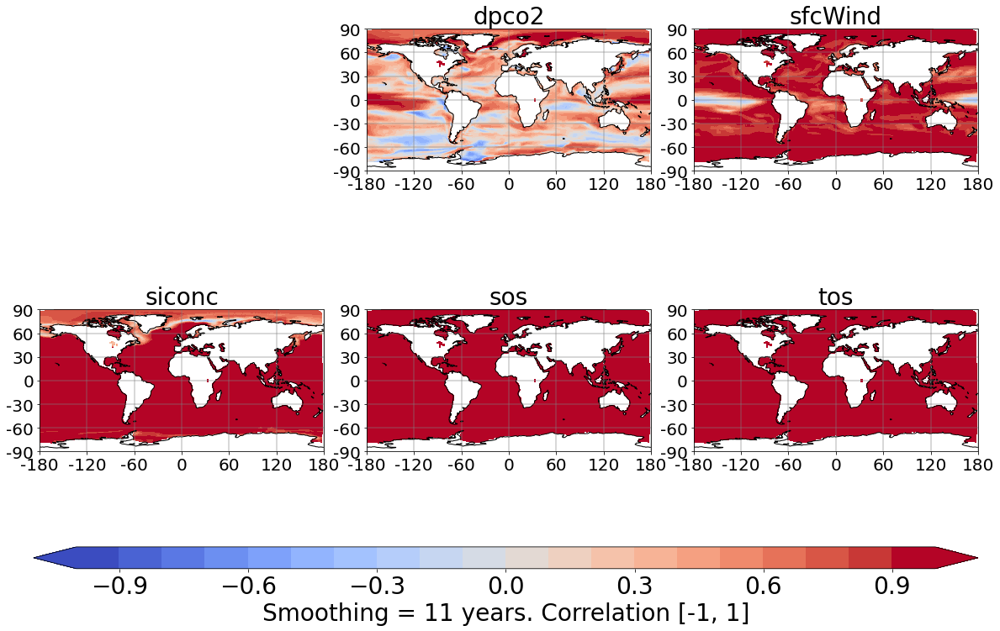

...

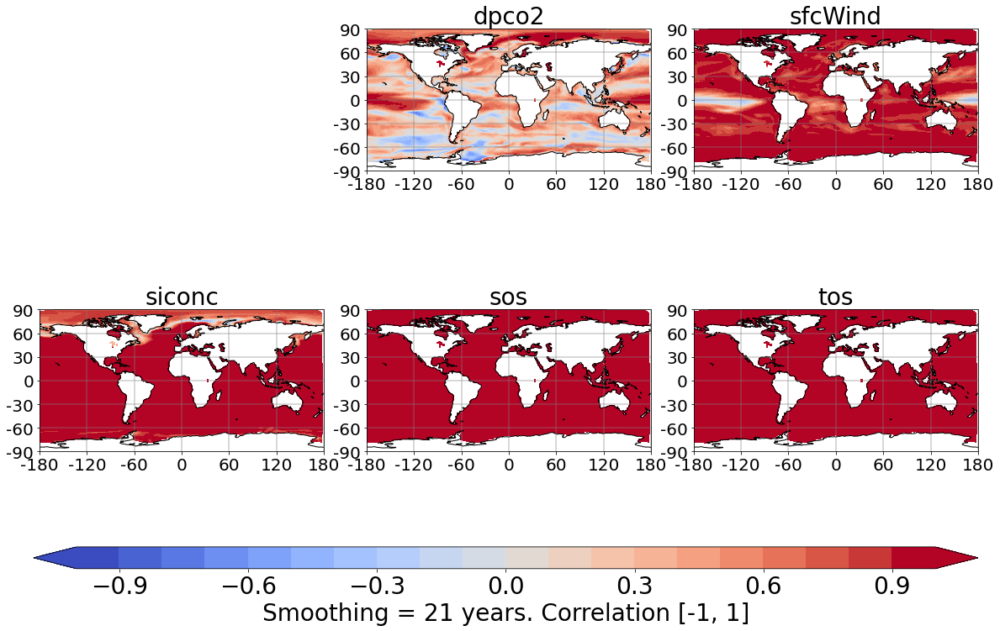

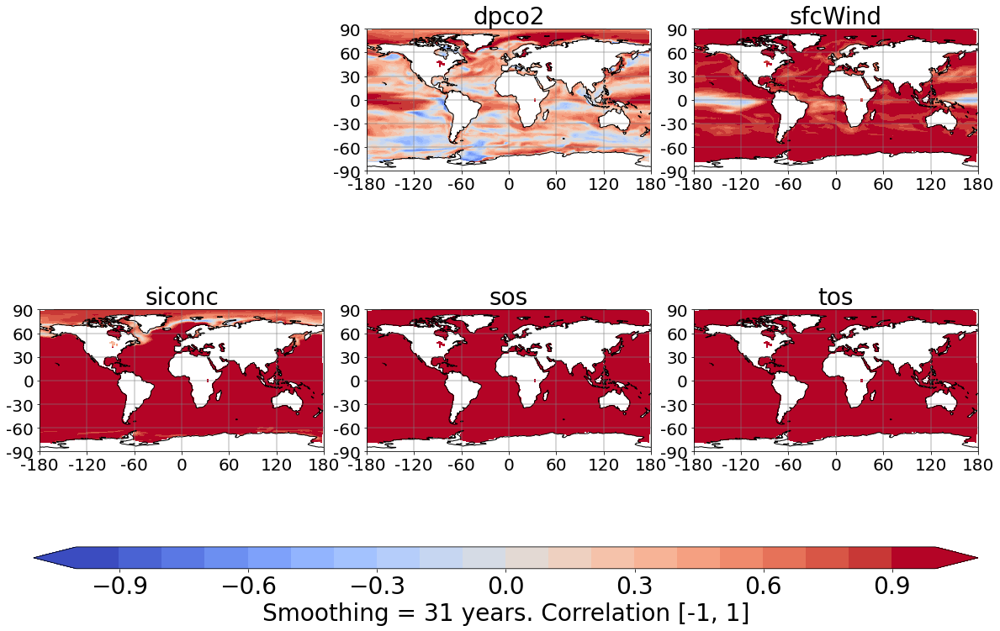

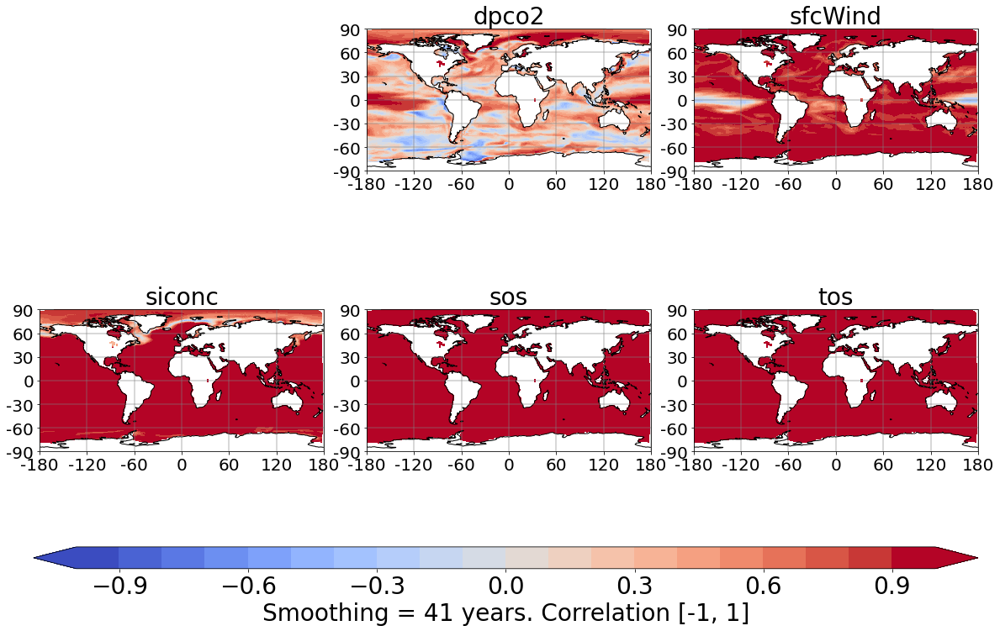

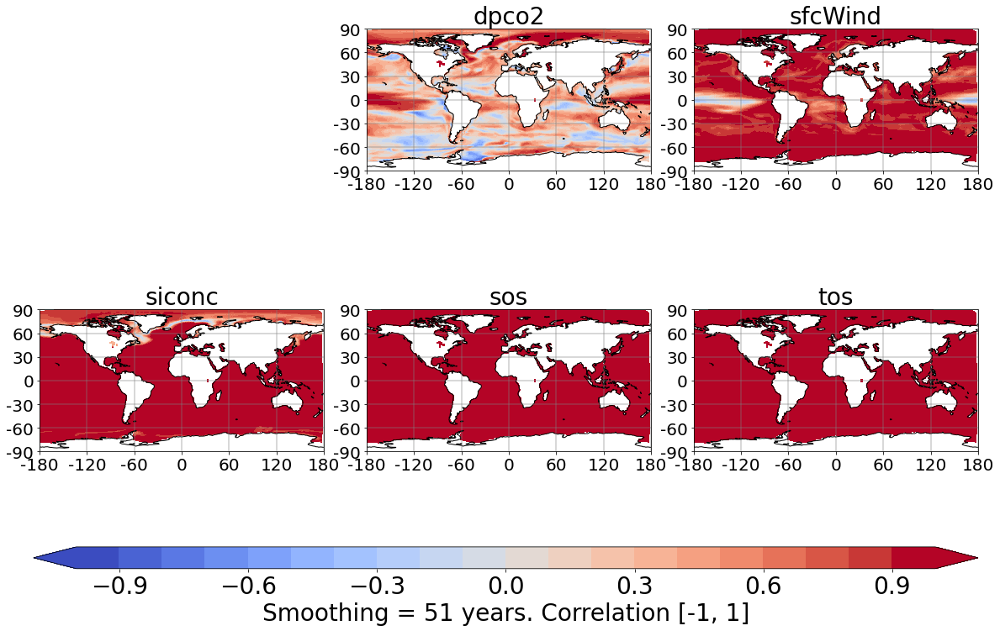

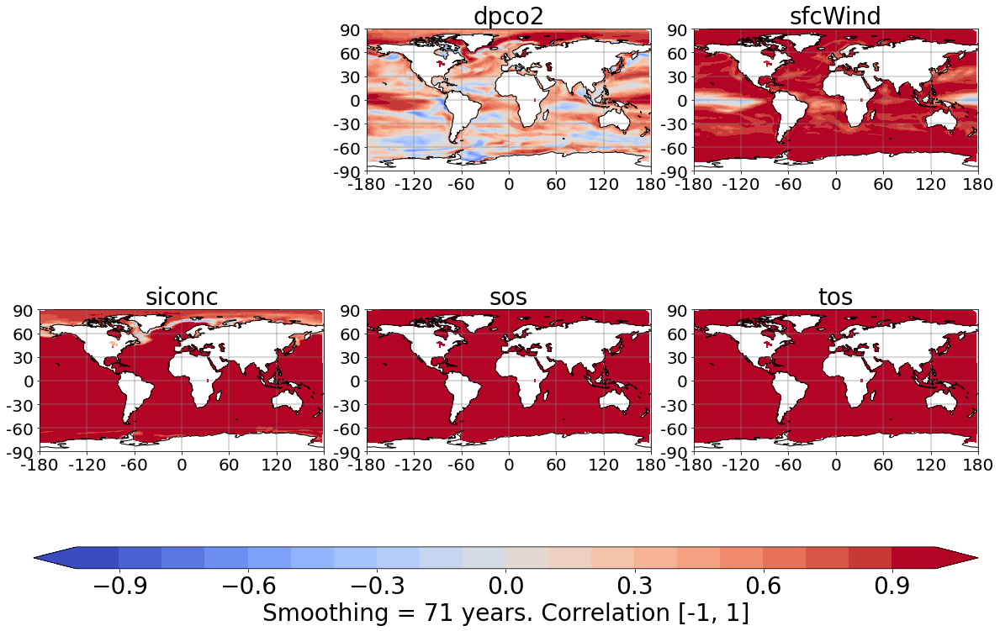

In [7]:
# =========================
# Plot the (one-constant) correlations for a given smoothing
# =========================
levels = np.linspace(-1, 1, 21)
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

for ismooth, smoothing in enumerate(smoothings):
    fig = plt.figure(figsize = (20, 12))
    fig.patch.set_facecolor('white')
    for ivar, var_name in enumerate(constant_vars):
        if var_name == 'none': continue
        ax = plt.subplot(gs1[ivar], projection=ccrs.PlateCarree())
        clevs = ax.pcolormesh(lon_re, lat_re, regrid_for_plotting(corrs_oneConstant[var_name][ismooth, :, :]),
                              cmap=cmap, norm=norm) 
        ax.set_title('{:s}'.format(var_name), fontsize=fontsize)
        plot_stuff()

    cax = fig.add_axes([0.12, 0.05, 0.78, 0.03])
    cb = fig.colorbar(clevs, cax=cax, extend='both', orientation='horizontal')
    cb.set_label(label='Smoothing = {:d} years. Correlation [-1, 1]'.format(smoothings[ismooth]), fontsize=fontsize)
    cb.ax.tick_params(labelsize=fontsize) 

    fig_save_file = '{:s}/CO2_Offline_OneConstant_Smoothing{:d}Y{:s}.png'.format(output_dir, smoothings[ismooth], detrend_string)
    plt.savefig(fig_save_file, bbox_inches = 'tight')
    print(fig_save_file)

/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneVaries_Smoothing1Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneVaries_Smoothing3Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneVaries_Smoothing5Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneVaries_Smoothing7Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneVaries_Smoothing11Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneVaries_Smoothing15Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneVaries_Smoothing21Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneVaries_Smoothing31Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneVaries_Smoothing41Y_detrended71Y.png
/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_OneVaries_Smoothing51Y_detrended71Y.png
/home/mmenary/

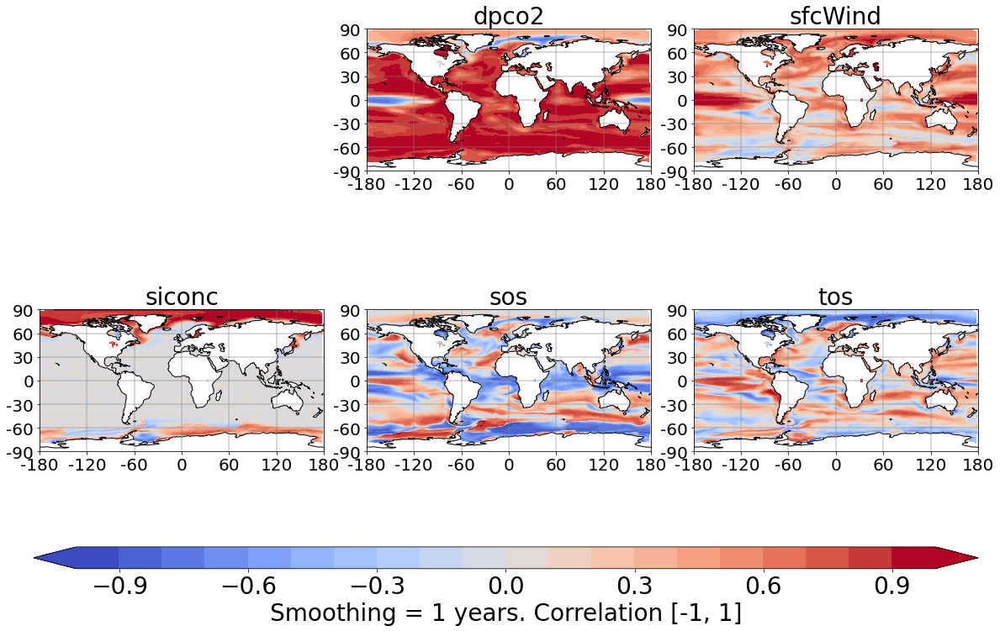

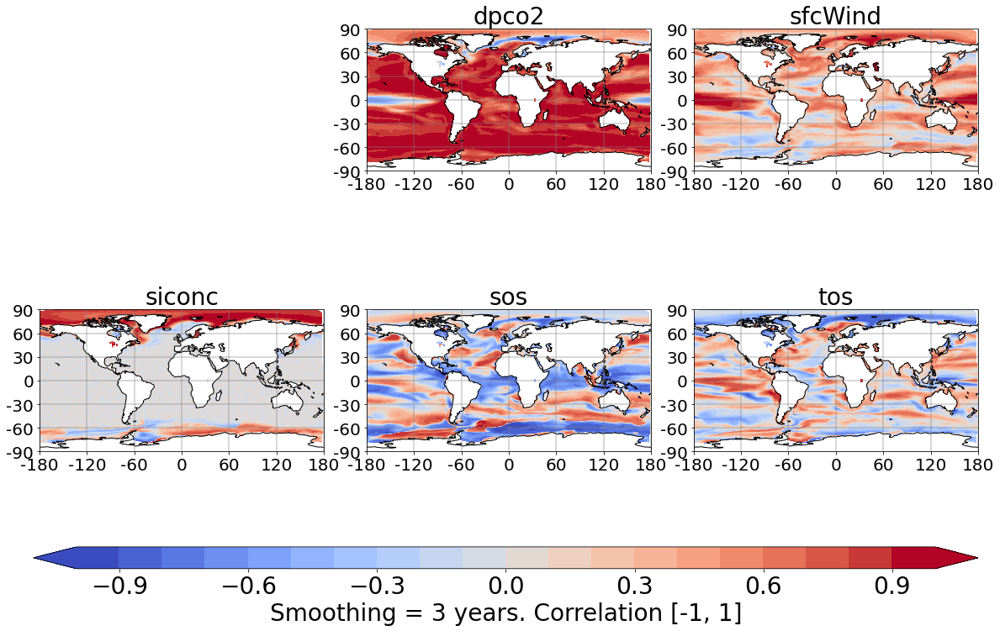

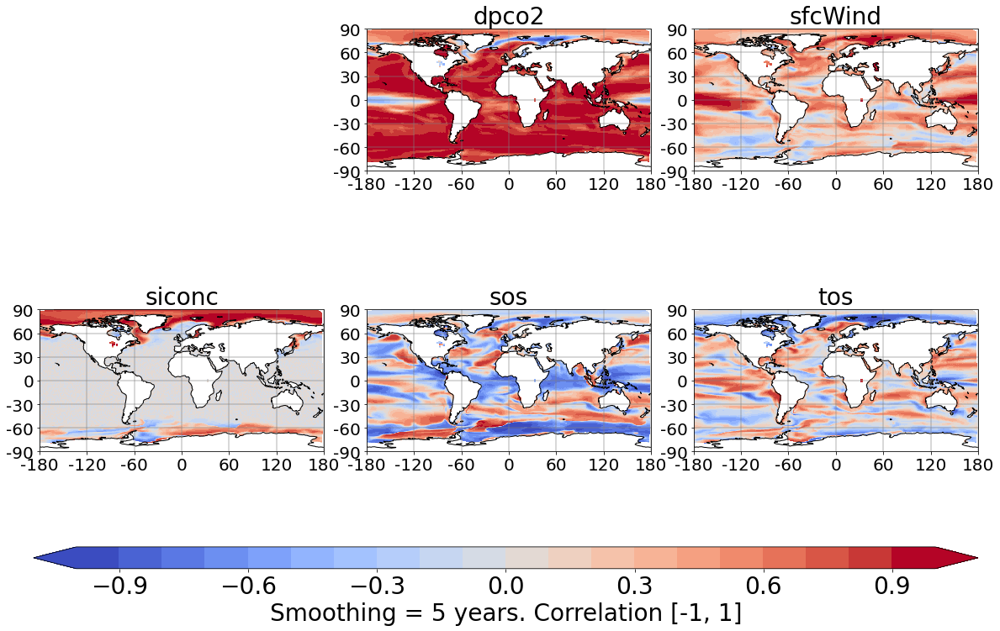

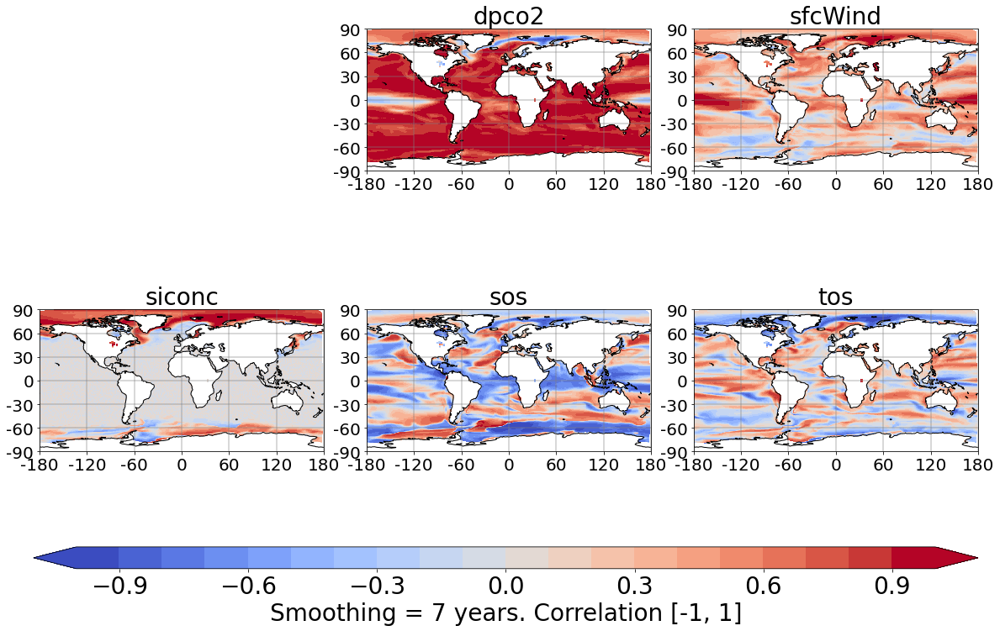

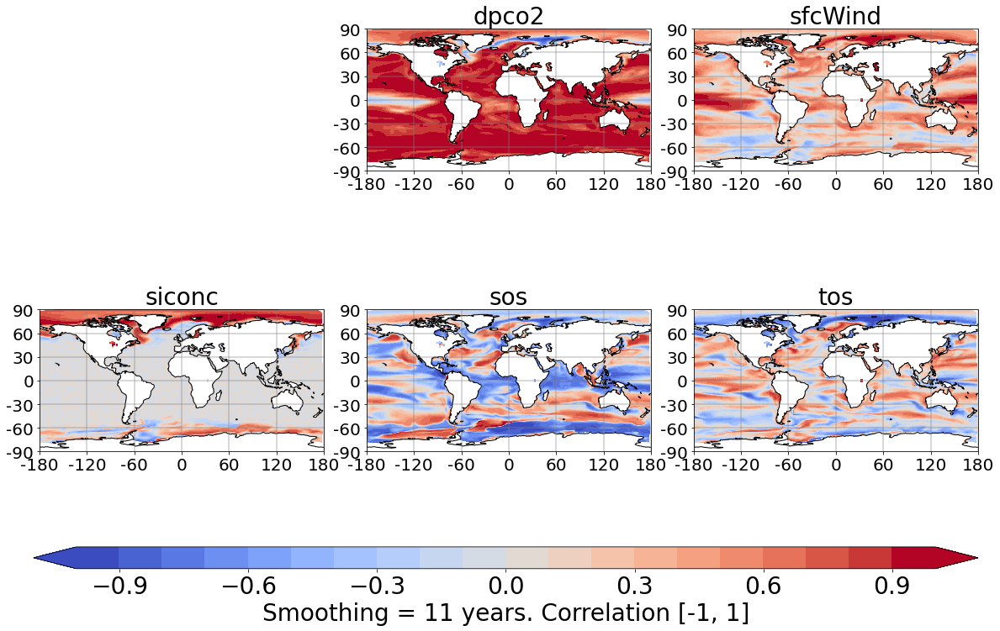

...

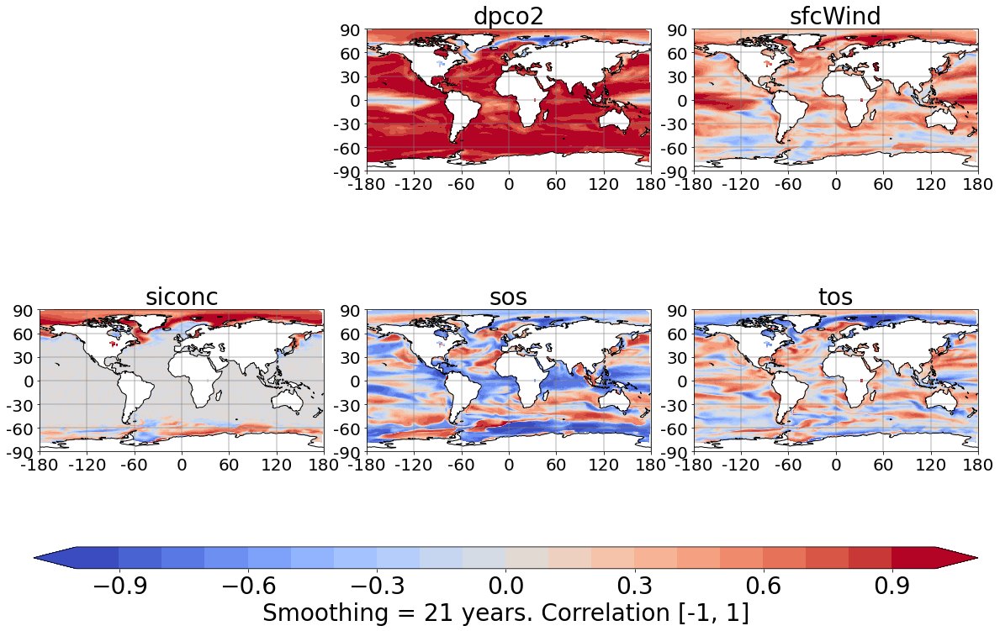

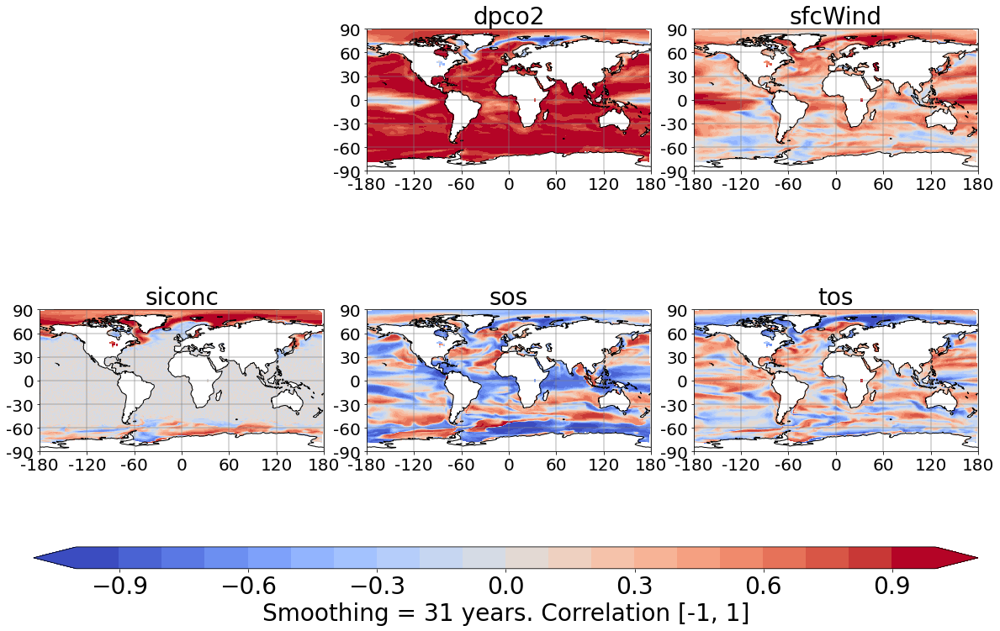

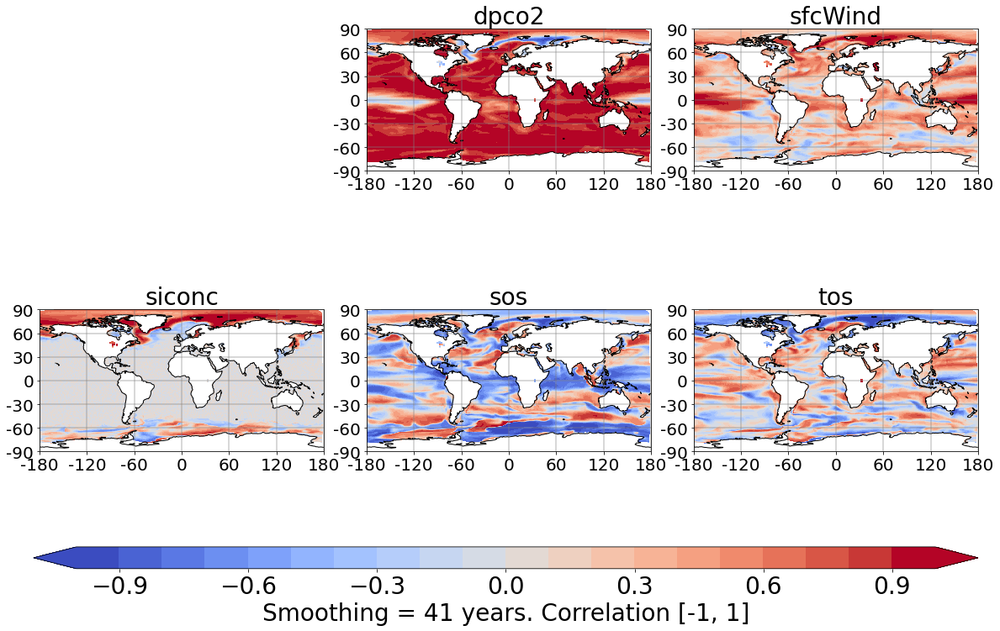

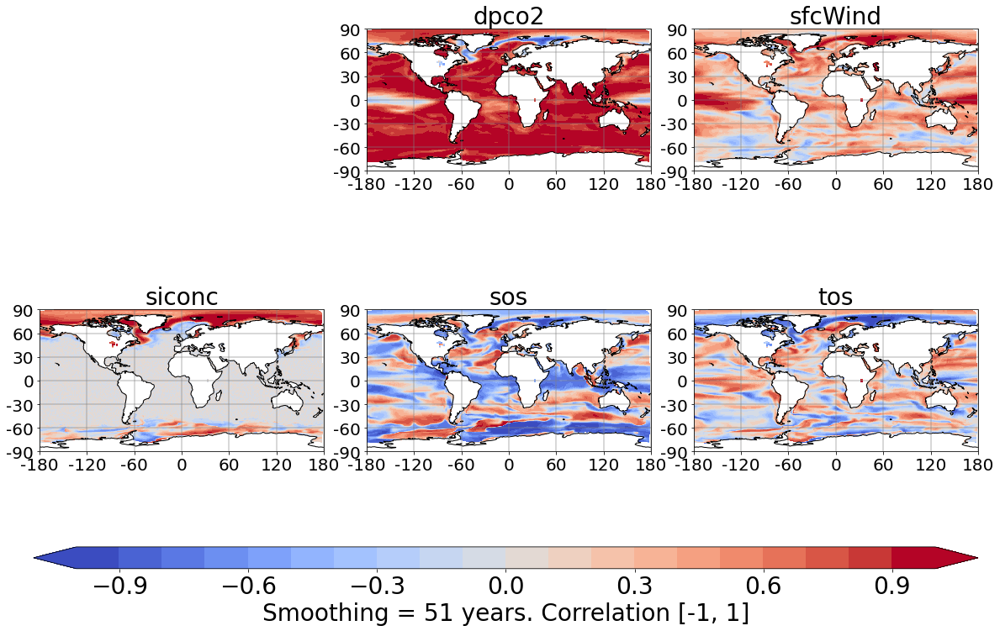

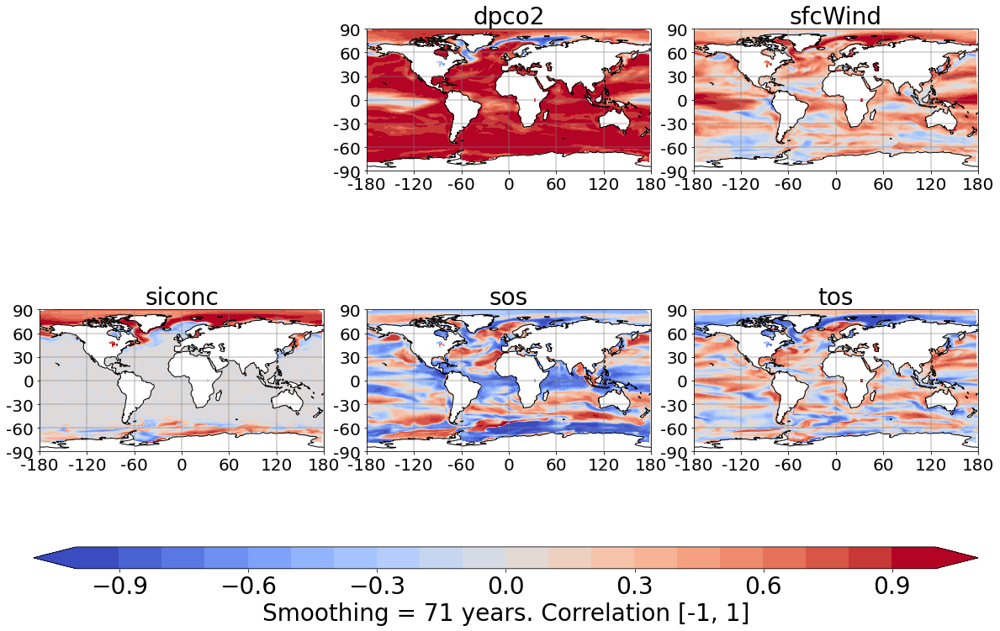

In [8]:
# =========================
# Plot the (one-varies) correlations for a given smoothing
# =========================
levels = np.linspace(-1, 1, 21)
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

for ismooth, smoothing in enumerate(smoothings):
    fig = plt.figure(figsize = (20, 12))
    fig.patch.set_facecolor('white')
    for ivar, var_name in enumerate(constant_vars):
        if var_name == 'none': continue
        ax = plt.subplot(gs1[ivar], projection=ccrs.PlateCarree())
        clevs = ax.pcolormesh(lon_re, lat_re, regrid_for_plotting(corrs_oneVary[var_name][ismooth, :, :]),
                              cmap=cmap, norm=norm) 
        ax.set_title('{:s}'.format(var_name), fontsize=fontsize)
        plot_stuff()

    cax = fig.add_axes([0.12, 0.05, 0.78, 0.03])
    cb = fig.colorbar(clevs, cax=cax, extend='both', orientation='horizontal')
    cb.set_label(label='Smoothing = {:d} years. Correlation [-1, 1]'.format(smoothings[ismooth]), fontsize=fontsize)
    cb.ax.tick_params(labelsize=fontsize) 

    fig_save_file = '{:s}/CO2_Offline_OneVaries_Smoothing{:d}Y{:s}.png'.format(output_dir, smoothings[ismooth], detrend_string)
    plt.savefig(fig_save_file, bbox_inches = 'tight')
    print(fig_save_file)

In [20]:
# =========================
# Find the most important variable for a given smoothing
# =========================
remake_save3 = True
save_file_best = '/data/mmenary/python_saves/CO2_BestCorrs{:s}.pkl'.format(detrend_string)
print(save_file_best)
if os.path.isfile(save_file_best) and not remake_save3:
    with open(save_file_best, 'rb') as handle:
        bestCorr_oneConstant, bestVar_oneConstant, bestCorr_oneVary, bestVar_oneVary, largestSlope_oneConstant, \
        largestSlopeVar_oneConstant, largestSlope_oneVary, largestSlopeVar_oneVary = pickle.load(handle)
else:
    bestCorr_oneConstant = np.ones(shape=(len(smoothings), nj2, ni2))
    bestVar_oneConstant = np.ma.masked_all(shape=(len(smoothings), nj2, ni2))
    bestCorr_oneVary = np.zeros(shape=(len(smoothings), nj2, ni2))
    bestVar_oneVary = np.ma.masked_all(shape=(len(smoothings), nj2, ni2))
    
    largestSlope_oneConstant = np.ones(shape=(len(smoothings), nj2, ni2)) * 1e6
    largestSlopeVar_oneConstant = np.ma.masked_all(shape=(len(smoothings), nj2, ni2))
    largestSlope_oneVary = np.zeros(shape=(len(smoothings), nj2, ni2))
    largestSlopeVar_oneVary = np.ma.masked_all(shape=(len(smoothings), nj2, ni2))
    
    for ismooth, smoothing in enumerate(smoothings):
        if ismooth >= 9: continue
#         if ismooth != 1: continue
        for jj in range(nj2):
#             if jj < 150: continue
            print(ismooth, jj)
            for ii in range(ni2):
                for ivar, var_name in enumerate(constant_vars):
                    if var_name == 'none': continue
                        
                    if np.ma.is_masked(corrs_oneConstant[var_name][ismooth, jj, ii]): continue

                    # For oneConstant we want the variable that (when held constant) ruins the corr the most
                    if corrs_oneConstant[var_name][ismooth, jj, ii] < bestCorr_oneConstant[ismooth, jj, ii]:
                        bestCorr_oneConstant[ismooth, jj, ii] = corrs_oneConstant[var_name][ismooth, jj, ii]
                        bestVar_oneConstant[ismooth, jj, ii] = ivar

                    # For oneVary, we want the variable that has the highest corr
                    if corrs_oneVary[var_name][ismooth, jj, ii] > bestCorr_oneVary[ismooth, jj, ii]:
                        bestCorr_oneVary[ismooth, jj, ii] = corrs_oneVary[var_name][ismooth, jj, ii]
                        bestVar_oneVary[ismooth, jj, ii] = ivar
                        
                    ## For the slopes, I probably want to only save ones where the corr is significant
                        
                    # For oneConstant we want the variable that (when held constant) ruins the corr the most
                    if abs(slopes_oneConstant[var_name][ismooth, jj, ii]) < abs(largestSlope_oneConstant[ismooth, jj, ii]):
                        largestSlope_oneConstant[ismooth, jj, ii] = slopes_oneConstant[var_name][ismooth, jj, ii]
                        largestSlopeVar_oneConstant[ismooth, jj, ii] = ivar

                    # For oneVary, we want the variable that has the highest corr
                    min_corr = 0.6
                    if corrs_oneVary[var_name][ismooth, jj, ii] > min_corr:
                        if abs(slopes_oneVary[var_name][ismooth, jj, ii]) > abs(largestSlope_oneVary[ismooth, jj, ii]):
                            largestSlope_oneVary[ismooth, jj, ii] = slopes_oneVary[var_name][ismooth, jj, ii]
                            largestSlopeVar_oneVary[ismooth, jj, ii] = ivar

    with open(save_file_best, 'wb') as handle:
        pickle.dump([bestCorr_oneConstant, bestVar_oneConstant, bestCorr_oneVary, bestVar_oneVary,
                    largestSlope_oneConstant, largestSlopeVar_oneConstant, largestSlope_oneVary, largestSlopeVar_oneVary],
                    handle, protocol=pickle.HIGHEST_PROTOCOL)

/data/mmenary/python_saves/CO2_BestCorrs_detrended71Y.pkl
0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
0 10
0 11
0 12
0 13
0 14
0 15
0 16
0 17
0 18
0 19
0 20
0 21
0 22
0 23
0 24
0 25
0 26
0 27
0 28
0 29
0 30
0 31
0 32
0 33
0 34
0 35
0 36
0 37
0 38
0 39
0 40
0 41
0 42
0 43
0 44
0 45
0 46
0 47
0 48
0 49
0 50
0 51
0 52
0 53
0 54
0 55
0 56
0 57
0 58
0 59
0 60
0 61
0 62
0 63
0 64
0 65
0 66
0 67
0 68
0 69
0 70
0 71
0 72
0 73
0 74
0 75
0 76
0 77
0 78
0 79
0 80
0 81
0 82
0 83
0 84
0 85
0 86
0 87
0 88
0 89
0 90
0 91
0 92
0 93
0 94
0 95
0 96
0 97
0 98
0 99
0 100
0 101
0 102
0 103
0 104
0 105
0 106
0 107
0 108
0 109
0 110
0 111
0 112
0 113
0 114
0 115
0 116
0 117
0 118
0 119
0 120
0 121
0 122
0 123
0 124
0 125
0 126
0 127
0 128
0 129
0 130
0 131
0 132
0 133
0 134
0 135
0 136
0 137
0 138
0 139
0 140
0 141
0 142
0 143
0 144
0 145
0 146
0 147
0 148
0 149
0 150
0 151
0 152
0 153
0 154
0 155
0 156
0 157
0 158
0 159
0 160
0 161
0 162
0 163
0 164
0 165
0 166
0 167
0 168
0 169
0 170
0 171
0 172
0 173
0 174
0 

4 124
4 125
4 126
4 127
4 128
4 129
4 130
4 131
4 132
4 133
4 134
4 135
4 136
4 137
4 138
4 139
4 140
4 141
4 142
4 143
4 144
4 145
4 146
4 147
4 148
4 149
4 150
4 151
4 152
4 153
4 154
4 155
4 156
4 157
4 158
4 159
4 160
4 161
4 162
4 163
4 164
4 165
4 166
4 167
4 168
4 169
4 170
4 171
4 172
4 173
4 174
4 175
4 176
4 177
4 178
4 179
4 180
4 181
4 182
4 183
4 184
4 185
4 186
4 187
4 188
4 189
4 190
4 191
4 192
4 193
4 194
4 195
4 196
4 197
4 198
4 199
4 200
4 201
4 202
4 203
4 204
4 205
4 206
4 207
4 208
4 209
4 210
4 211
4 212
4 213
4 214
4 215
4 216
4 217
4 218
4 219
4 220
4 221
4 222
4 223
4 224
4 225
4 226
4 227
4 228
4 229
4 230
4 231
4 232
4 233
4 234
4 235
4 236
4 237
4 238
4 239
4 240
4 241
4 242
4 243
4 244
4 245
4 246
4 247
4 248
4 249
4 250
4 251
4 252
4 253
4 254
4 255
4 256
4 257
4 258
4 259
4 260
4 261
4 262
4 263
4 264
4 265
4 266
4 267
4 268
4 269
4 270
4 271
4 272
4 273
4 274
4 275
4 276
4 277
4 278
4 279
4 280
4 281
4 282
4 283
4 284
4 285
4 286
4 287
4 288
4 289
4 29

8 240
8 241
8 242
8 243
8 244
8 245
8 246
8 247
8 248
8 249
8 250
8 251
8 252
8 253
8 254
8 255
8 256
8 257
8 258
8 259
8 260
8 261
8 262
8 263
8 264
8 265
8 266
8 267
8 268
8 269
8 270
8 271
8 272
8 273
8 274
8 275
8 276
8 277
8 278
8 279
8 280
8 281
8 282
8 283
8 284
8 285
8 286
8 287
8 288
8 289
8 290
8 291
8 292
8 293
8 294
8 295
8 296
8 297
8 298
8 299
8 300
8 301
8 302
8 303
8 304
8 305
8 306
8 307
8 308
8 309
8 310
8 311
8 312
8 313
8 314
8 315
8 316
8 317
8 318
8 319
8 320
8 321
8 322
8 323
8 324
8 325
8 326
8 327
8 328
8 329
8 330


/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_BestVar_OneConstant_detrended71Y.png


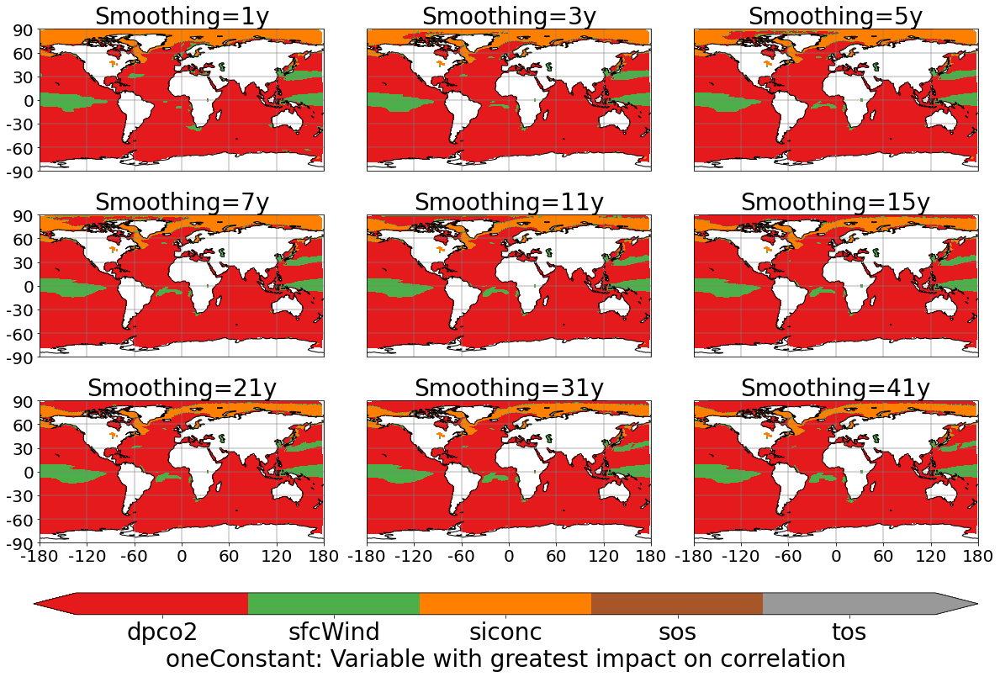

In [10]:
nrows = 3
ncols = 3
gs1 = gridspec.GridSpec(nrows, ncols)
gs1.update(wspace=0.15, hspace=0.05)

cmap2 = plt.get_cmap('Set1')
levels2 = np.arange(len(constant_vars)) + 0.5
norm2 = BoundaryNorm(levels2, ncolors=cmap2.N, clip=True)

fig = plt.figure(figsize = (20, 12))
fig.patch.set_facecolor('white')
for ismooth, smoothing in enumerate(smoothings):
    if ismooth >= 9: continue
#     if ismooth != 1: continue
    ax = plt.subplot(gs1[ismooth], projection=ccrs.PlateCarree())
    clevs = ax.pcolormesh(lon_re, lat_re, regrid_for_plotting(bestVar_oneConstant[ismooth, :, :]),
                          cmap=cmap2, norm=norm2) 
    ax.set_title('Smoothing={:d}y'.format(smoothing), fontsize=fontsize)
    if (ismooth % ncols) == 0:
        showy = True
    else:
        showy = False
    if (ismooth >= (ncols * (nrows - 1))):
        showx = True
    else:
        showx = False
    plot_stuff(showx=showx, showy=showy)

cax = fig.add_axes([0.12, 0.05, 0.78, 0.03])
cb = fig.colorbar(clevs, cax=cax, extend='both', orientation='horizontal')
cb.set_label(label='oneConstant: Variable with greatest impact on correlation', fontsize=fontsize)
cb.ax.tick_params(labelsize=fontsize)
cb.set_ticks(np.arange(len(constant_vars[1:]) + 1))
cb.set_ticklabels(constant_vars[1:])

fig_save_file = '{:s}/CO2_Offline_BestVar_OneConstant{:s}.png'.format(output_dir, detrend_string)
plt.savefig(fig_save_file, bbox_inches = 'tight')
print(fig_save_file)

/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_BestVar_oneVary_detrended71Y.png


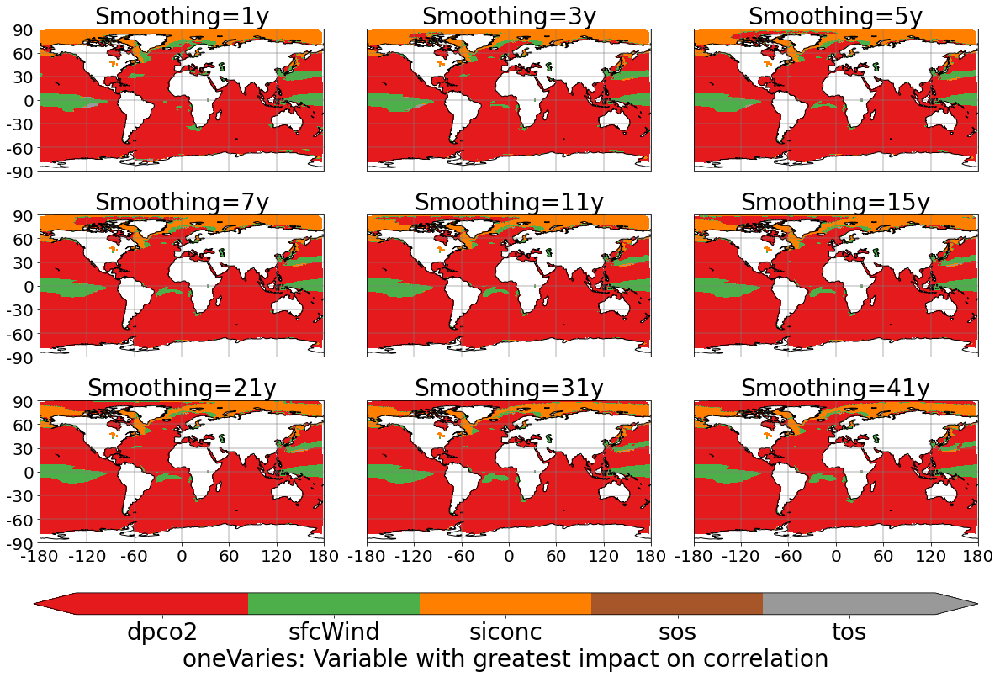

In [11]:
fig = plt.figure(figsize = (20, 12))
fig.patch.set_facecolor('white')
for ismooth, smoothing in enumerate(smoothings):
    if ismooth >= 9: continue
#     if ismooth != 1: continue
    ax = plt.subplot(gs1[ismooth], projection=ccrs.PlateCarree())
    clevs = ax.pcolormesh(lon_re, lat_re, regrid_for_plotting(bestVar_oneVary[ismooth, :, :]),
                          cmap=cmap2, norm=norm2) 
    ax.set_title('Smoothing={:d}y'.format(smoothing), fontsize=fontsize)
    if (ismooth % ncols) == 0:
        showy = True
    else:
        showy = False
    if (ismooth >= (ncols * (nrows - 1))):
        showx = True
    else:
        showx = False
    plot_stuff(showx=showx, showy=showy)

cax = fig.add_axes([0.12, 0.05, 0.78, 0.03])
cb = fig.colorbar(clevs, cax=cax, extend='both', orientation='horizontal')
cb.set_label(label='oneVaries: Variable with greatest impact on correlation', fontsize=fontsize)
cb.ax.tick_params(labelsize=fontsize)
cb.set_ticks(np.arange(len(constant_vars[1:]) + 1))
cb.set_ticklabels(constant_vars[1:])

fig_save_file = '{:s}/CO2_Offline_BestVar_oneVary{:s}.png'.format(output_dir, detrend_string)
plt.savefig(fig_save_file, bbox_inches = 'tight')
print(fig_save_file)

/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_LargestSlopeVar_OneConstant_detrended71Y.png


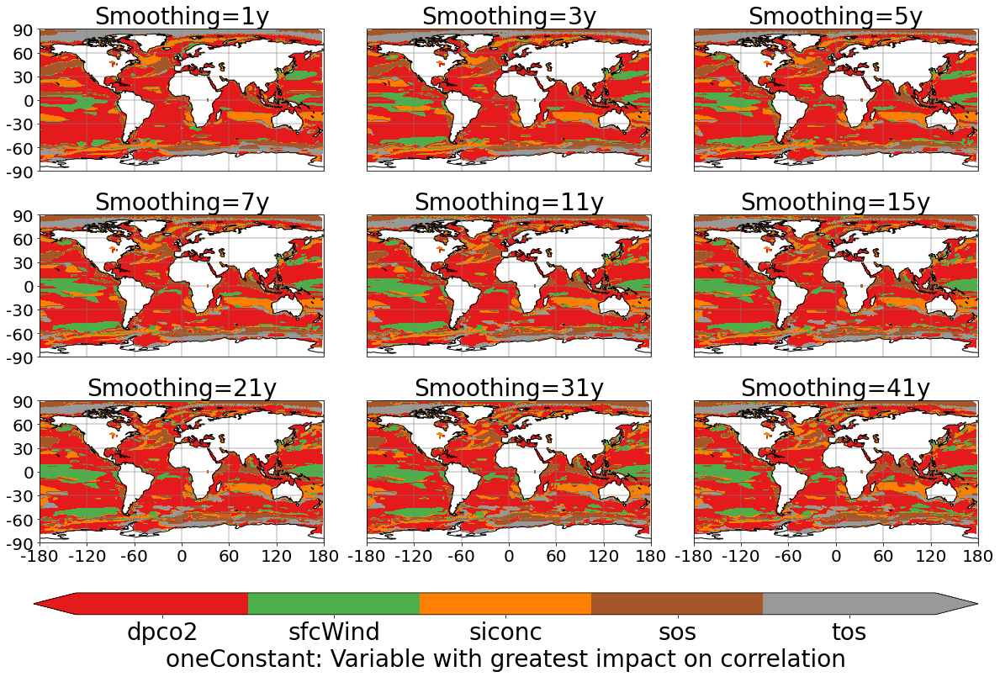

In [12]:
# ==================
# Not sure how meaningful the slope in the oneConstant version is
# ==================
fig = plt.figure(figsize = (20, 12))
fig.patch.set_facecolor('white')
for ismooth, smoothing in enumerate(smoothings):
    if ismooth >= 9: continue
#     if ismooth != 1: continue
    ax = plt.subplot(gs1[ismooth], projection=ccrs.PlateCarree())
    clevs = ax.pcolormesh(lon_re, lat_re, regrid_for_plotting(largestSlopeVar_oneConstant[ismooth, :, :]),
                          cmap=cmap2, norm=norm2) 
    ax.set_title('Smoothing={:d}y'.format(smoothing), fontsize=fontsize)
    if (ismooth % ncols) == 0:
        showy = True
    else:
        showy = False
    if (ismooth >= (ncols * (nrows - 1))):
        showx = True
    else:
        showx = False
    plot_stuff(showx=showx, showy=showy)

cax = fig.add_axes([0.12, 0.05, 0.78, 0.03])
cb = fig.colorbar(clevs, cax=cax, extend='both', orientation='horizontal')
cb.set_label(label='oneConstant: Variable with greatest impact on correlation', fontsize=fontsize)
cb.ax.tick_params(labelsize=fontsize)
cb.set_ticks(np.arange(len(constant_vars[1:]) + 1))
cb.set_ticklabels(constant_vars[1:])

fig_save_file = '{:s}/CO2_Offline_LargestSlopeVar_OneConstant{:s}.png'.format(output_dir, detrend_string)
plt.savefig(fig_save_file, bbox_inches = 'tight')
print(fig_save_file)

/home/mmenary/python/notebooks/CO2_Py3x/output/CO2_Offline_LargestSlopeVar_oneVary_detrended71Y.png


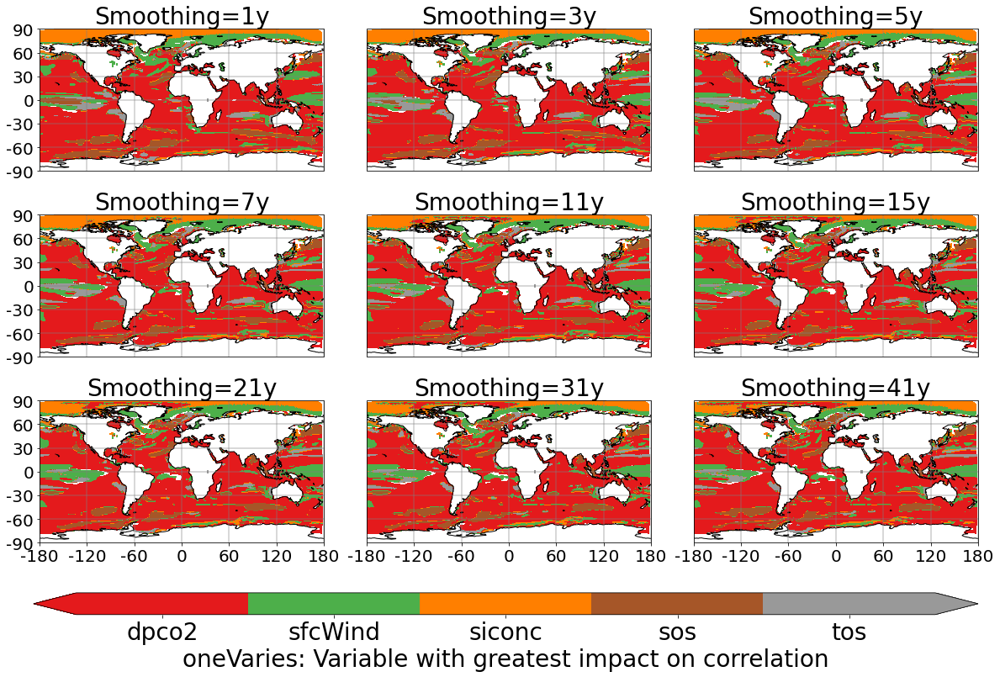

In [21]:
fig = plt.figure(figsize = (20, 12))
fig.patch.set_facecolor('white')
for ismooth, smoothing in enumerate(smoothings):
    if ismooth >= 9: continue
#     if ismooth != 1: continue
    ax = plt.subplot(gs1[ismooth], projection=ccrs.PlateCarree())
    clevs = ax.pcolormesh(lon_re, lat_re, regrid_for_plotting(largestSlopeVar_oneVary[ismooth, :, :]),
                          cmap=cmap2, norm=norm2) 
    ax.set_title('Smoothing={:d}y'.format(smoothing), fontsize=fontsize)
    if (ismooth % ncols) == 0:
        showy = True
    else:
        showy = False
    if (ismooth >= (ncols * (nrows - 1))):
        showx = True
    else:
        showx = False
    plot_stuff(showx=showx, showy=showy)

cax = fig.add_axes([0.12, 0.05, 0.78, 0.03])
cb = fig.colorbar(clevs, cax=cax, extend='both', orientation='horizontal')
cb.set_label(label='oneVaries: Variable with greatest impact on correlation', fontsize=fontsize)
cb.ax.tick_params(labelsize=fontsize)
cb.set_ticks(np.arange(len(constant_vars[1:]) + 1))
cb.set_ticklabels(constant_vars[1:])

fig_save_file = '{:s}/CO2_Offline_LargestSlopeVar_oneVary{:s}.png'.format(output_dir, detrend_string)
plt.savefig(fig_save_file, bbox_inches = 'tight')
print(fig_save_file)

In [1]:
# cmap = plt.get_cmap('coolwarm')

# plt.figure(figsize=(15, 10))
# for ivar, var_name in enumerate(constant_vars):
#     if ivar == 0: continue
#     plt.subplot(2, 3, ivar)
#     plt.pcolormesh(slopes_oneVary[var_name][0, :, :], vmin=-4, vmax=4, cmap=cmap)
#     plt.title(var_name)
# #     plt.colorbar()

In [2]:
# cmap = plt.get_cmap('coolwarm')

# plt.figure(figsize=(15, 10))
# for ivar, var_name in enumerate(constant_vars):
#     if ivar == 0: continue
#     plt.subplot(2, 3, ivar)
#     plt.pcolormesh(1./slopes_oneVary[var_name][0, :, :], vmin=-4, vmax=4, cmap=cmap)
#     plt.title(var_name)
# #     plt.colorbar()